## Import Libraries

In [2]:
import cv2 as cv 
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline

### Helper functions
**_Show Image Helper Function_** This helper function is used to plot the image , with a given title has a default value of **_"Image"_** , we also pass to the function color map argument that it has default value of **_gray_**


In [3]:
def show_image(image , title = "Image" , color_map = "gray") :
    plt.imshow(image , cmap= color_map)
    plt.title(title)
    plt.show

**_Region Of Interest Helper Functions_**
We will crop part of the photo where we are have more interest in this region to determine the lane lines , the steps are the following we make a black image with all zeros , then we have the vertices of ploy to draw on the black image , then making masking using python function `cv.bitwise_and()`

In [4]:
def region_of_intereset(image , vertices):
    blank = np.zeros_like(image)
    cv.fillPoly(blank , vertices , color = 255)
    cropped_region = cv.bitwise_and(image , blank)
    return cropped_region

**_Fill Area Between Lane Lines Helper Function_** we here after detecting the lane lines we just color the area between them , by passing to the funtion the 4 vertices of the two lane lines

In [5]:
def fill_area_between_lane_lines(image , polyfill_vertices):
    point1 = ()
    point2 = ()
    point3 = ()
    point4 = ()
    for i in range(0 , 4) :
        x1 , y1 = polyfill_vertices[i]
        if(i == 0):
            point1 = (x1 , y1)
            ++i
        elif(i == 1):
            point2 = (x1 , y1)
            ++i
        elif(i == 2):
            point3 = (x1, y1)
            ++i
        elif(i == 3):
            point4 = (x1, y1)
            ++i
    polyfill_vertices_in_right_order = [point1 , point2 , point4 , point3]
    cv.fillPoly(image , np.array([polyfill_vertices_in_right_order] , np.int64) , (92, 255, 92))

**_Three Channel Image Conversion Helper Function_** here we take image of signle channel and convert it to 3 channels in the purpose of concatenate it with other images in the debugging mode

In [6]:
def three_channle_image_conversion(source_image , converted_image):
    blank_image = np.zeros_like(source_image)
    blank_image[:,:,0] = converted_image
    blank_image[:,:,1] = converted_image
    blank_image[:,:,2] = converted_image
    return blank_image

**_Debuggind Mode Image Hepler Function_** we here concatenate all the image stages that it has passed through in the pipeline in one image

> This function is activated only when Debugging Mode is set **_Activated_**

In [7]:
def debugging_mode_image(test_image , gray_test_image , RGB_test_image , hls_test_image , s , canny_test_image , cropped_test_image):
    v_image1 = np.vstack([cv.resize(test_image , (320 , 320)) , cv.resize(three_channle_image_conversion(test_image , gray_test_image) , (320 , 320))])
    h_image1 = np.hstack([cv.resize(RGB_test_image , (960 , 400)) , cv.resize(v_image1, (320 , 400))])
    h_image2 = np.hstack([cv.resize(hls_test_image , (320 , 320)) , cv.resize(three_channle_image_conversion(test_image , s) , (320 , 320))])
    h_image3 = np.hstack([cv.resize(three_channle_image_conversion(test_image , canny_test_image) , (320 , 320)) , cv.resize(three_channle_image_conversion(test_image , cropped_test_image) , (320 , 320))])
    h_image4 = np.hstack([cv.resize(h_image2 , (640 , 320)) , cv.resize(h_image3 , (640 , 320))])
    debugging_image = np.vstack([cv.resize(h_image1 , (1280 , 400)) , cv.resize(h_image4 , (1280 , 320))])
    return debugging_image

**_Channel Thresholding Helper Function_** we here pass evry channel which are the best channels in each color space and apply thresholding to these channels 

In [8]:
def applyThreshold(channel, thresh):
    # Create an image of all zeros
    binary_output = np.zeros_like(channel)
    
    # Apply a threshold to the channel with inclusive thresholds 
    binary_output[(channel >= thresh[0]) & (channel <= thresh[1])] = 1
    
    return binary_output

**_Sobel Operator Helper Function_** we here apply sobel operator to get strong gradient in the image , and that will tell us the sharp changes in the image

In [9]:
def calc_sobel(img, sx=False, sy=False, sobel_kernel=5, thresh=(25, 200)):
    
    # Convert to grayscale - sobel can only have one color channel
    gray = cv.cvtColor(img, cv.COLOR_RGB2GRAY)
    
    # Take the sobel gradient in x and y
    sobelx = cv.Sobel(gray, cv.CV_64F, 1, 0)
    sobely = cv.Sobel(gray, cv.CV_64F, 0, 1)
    
    if sx:
        abs_sobel = np.absolute(sobelx)
        scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    elif sy:
        abs_sobel = np.absolute(sobely)
        scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    else:
        # Calculate the magnitude 
        mag_sobel = np.sqrt(np.square(sobelx) + np.square(sobely))
    
        # Scale to 8-bit (0 - 255) and convert to type = np.uint8
        scaled_sobel = np.uint8(255*mag_sobel/np.max(mag_sobel))

    # Create a binary mask where mag thresholds are me
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1   

    return sxbinary

### Read the test image

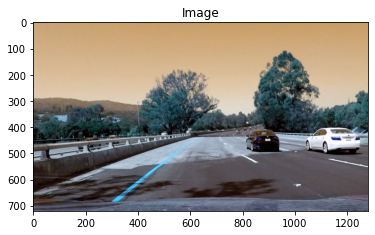

In [10]:
test_image = cv.imread("test_images/test4.jpg")
show_image(test_image)
debug_mode = 1

### Change image to different color spaces

##### RGB color space 

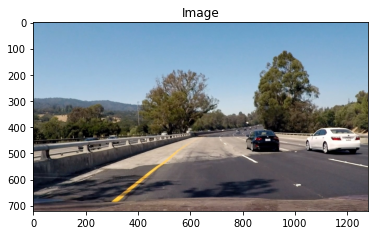

In [11]:
RGB_test_image = cv.cvtColor(test_image , cv.COLOR_BGR2RGB)
show_image(RGB_test_image)

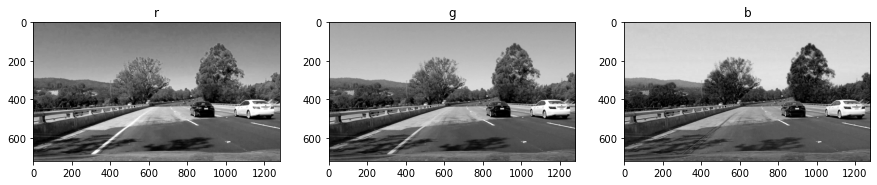

In [12]:
r_rgb_channel , g_rgb_channel  , b_rgb_channel  = cv.split(RGB_test_image)
fig = plt.figure(figsize=(15,15))
fig.add_subplot(1,3,1)
show_image(r_rgb_channel, 'r')
fig.add_subplot(1,3,2)
show_image(g_rgb_channel, 'g')
fig.add_subplot(1,3,3)
show_image(b_rgb_channel, 'b')

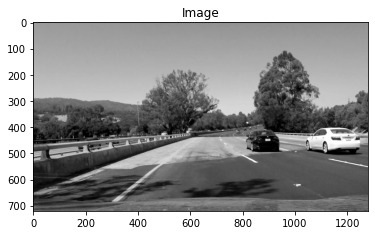

In [13]:
gray_test_image = cv.cvtColor(RGB_test_image , cv.COLOR_RGB2GRAY)
show_image(gray_test_image)

##### HLS color space

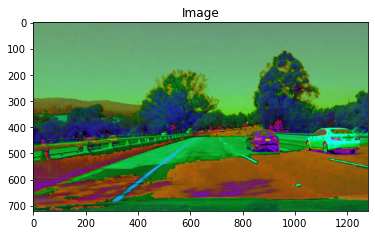

In [14]:
hls_test_image = cv.cvtColor(RGB_test_image , cv.COLOR_RGB2HLS)
show_image(hls_test_image)

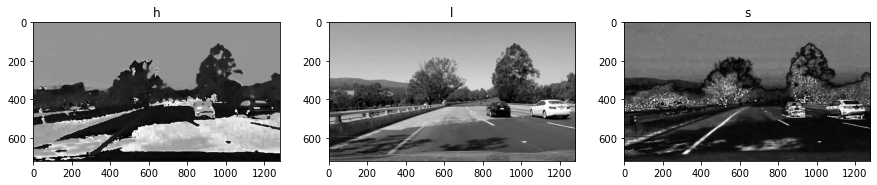

In [15]:
h_hls_channel , l_hls_channel , s_hls_channel = cv.split(hls_test_image)
fig = plt.figure(figsize=(15,15))
fig.add_subplot(1,3,1)
show_image(h_hls_channel, 'h')
fig.add_subplot(1,3,2)
show_image(l_hls_channel, 'l')
fig.add_subplot(1,3,3)
show_image(s_hls_channel, 's')

##### HSV color space

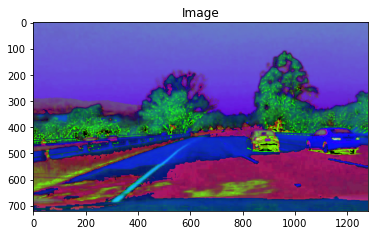

In [16]:
hsv_test_image = cv.cvtColor(RGB_test_image , cv.COLOR_RGB2HSV)
show_image(hsv_test_image)

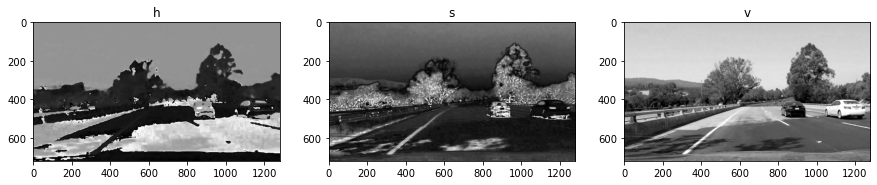

In [17]:
h_hsv_channel , s_hsv_channel , v_hsv_channel = cv.split(hsv_test_image)
fig = plt.figure(figsize=(15,15))
fig.add_subplot(1,3,1)
show_image(h_hsv_channel, 'h')
fig.add_subplot(1,3,2)
show_image(s_hsv_channel, 's')
fig.add_subplot(1,3,3)
show_image(v_hsv_channel, 'v')

##### LAB color space

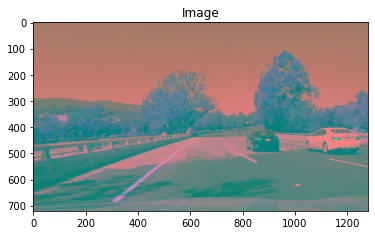

In [18]:
lab_test_image = cv.cvtColor(RGB_test_image , cv.COLOR_RGB2LAB)
show_image(lab_test_image)

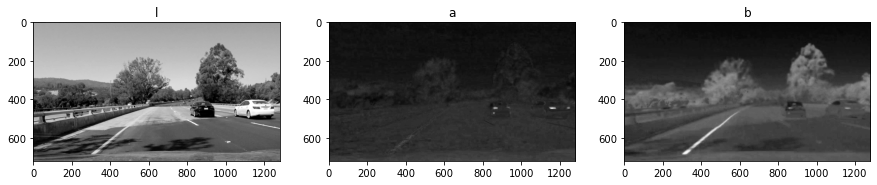

In [19]:
l_lab_channel , a_lab_channel , b_lab_channel = cv.split(lab_test_image)
fig = plt.figure(figsize=(15,15))
fig.add_subplot(1,3,1)
show_image(l_lab_channel, 'l')
fig.add_subplot(1,3,2)
show_image(a_lab_channel, 'a')
fig.add_subplot(1,3,3)
show_image(b_lab_channel, 'b')

##### LUV color space

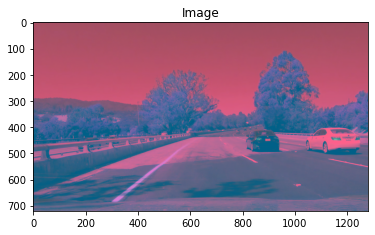

In [20]:
luv_test_image = cv.cvtColor(RGB_test_image , cv.COLOR_RGB2LUV)
show_image(luv_test_image)

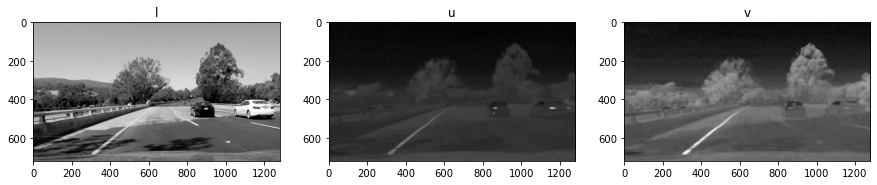

In [21]:
l_luv_channel , u_luv_channel , v_luv_channel = cv.split(luv_test_image)
fig = plt.figure(figsize=(15,15))
fig.add_subplot(1,3,1)
show_image(l_luv_channel, 'l')
fig.add_subplot(1,3,2)
show_image(u_luv_channel, 'u')
fig.add_subplot(1,3,3)
show_image(v_luv_channel, 'v')

### After displaying all channels in each color spaces we now will choose the best channels in each color space 

> Best in RGB Channel is **_R_**

> Best in HLS Channel is **_S_**

> Best in HSV Channel is **_V_**

> Best in LAB Channel is **_B_**

> Best in LUV Channel is **_L_**

In [36]:
def combined_image(RGB_test_image , r_rgb_channel , s_hls_channel 
                   , b_lab_channel , l_luv_channel):
    r = applyThreshold(r_rgb_channel , (255 , 255))
    s = applyThreshold(s_hls_channel , (220 , 250))
    b = applyThreshold(b_lab_channel , (175 , 255))
    l = applyThreshold(l_luv_channel , (215 , 255))
    sobel = calc_sobel(RGB_test_image, sx=True, sobel_kernel= 5, thresh=(35 , 50))
    combined_binary = np.zeros_like(r)
    combined_binary[ (r == 1) | (s == 1) | (b == 1) | (l == 1) | (sobel == 1)] = 255  # 1
    
    return combined_binary

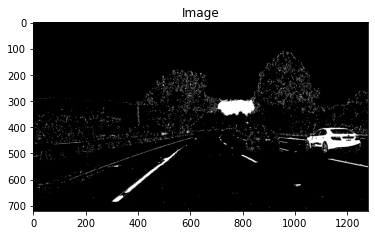

In [37]:
combined = combined_image(RGB_test_image , r_rgb_channel , s_hls_channel 
                   , b_lab_channel , l_luv_channel) 
show_image(combined)

In [38]:
# plt.hist(combined, bins=256)
# plt.title('histogram')

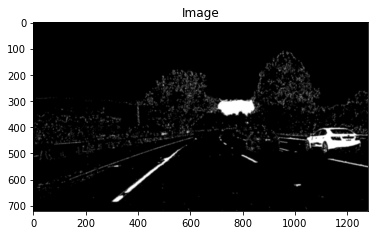

In [39]:
blurred_test_image = cv.GaussianBlur(combined , (7,7) , 0)
show_image(blurred_test_image)

In [40]:
blurred_test_image.shape

(720, 1280)

Text(0.5, 1.0, 'histogram')

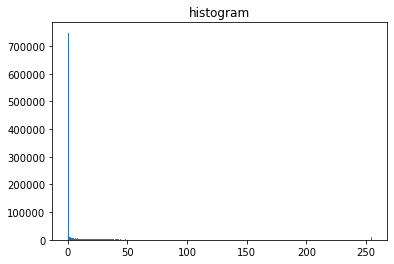

In [41]:
plt.hist(blurred_test_image.ravel(), bins=256)
plt.title('histogram')

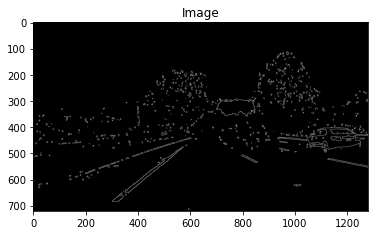

In [45]:
canny_test_image = cv.Canny(blurred_test_image, 200 ,255)
show_image(canny_test_image)

In [66]:
def add_points(img, src):
    img2 = np.copy(img)
    color = [255, 0, 0] # Red
    thickness = -1
    radius = 15
    x0, y0 = src[0]
    x1, y1 = src[1]
    x2, y2 = src[2]
    x3, y3 = src[3]
    cv.circle(img2, (int(x0), int(y0)), radius, color, thickness)
    cv.circle(img2, (int(x1), int(y1)), radius, color, thickness)
    cv.circle(img2, (int(x2), int(y2)), radius, color, thickness)
    cv.circle(img2, (int(x3), int(y3)), radius, color, thickness)

    return img2

def add_lines(img, src):
    img2 = np.copy(img)
    color = [255, 0, 0] # Red
    thickness = 2
    x0, y0 = src[0]
    x1, y1 = src[1]
    x2, y2 = src[2]
    x3, y3 = src[3]
    cv.line(img2, (int(x0), int(y0)), (int(x1), int(y1)), color, thickness)
    cv.line(img2,(int(x1), int(y1)), (int(x2), int(y2)), color, thickness)
    cv.line(img2, (int(x2), int(y2)), (int(x3), int(y3)), color, thickness)
    cv.line(img2,(int(x3), int(y3)), (int(x0), int(y0)), color, thickness)
    return img2

In [64]:
img = np.copy(RGB_test_image)
h, w = img.shape[:2]

src = np.float32([
    [210, 700],
    [570, 460], 
    [705, 460], 
    [1075, 700]
])

dst = np.float32([
    [400, 720],
    [400, 0], 
    [w-400, 0], 
    [w-400, 720]
])


def warper(img):
    
    # Compute and apply perpective transform
    img_size = (img.shape[1], img.shape[0])
    M = cv.getPerspectiveTransform(src, dst)
    warped = cv.warpPerspective(img, M, img_size, flags=cv.INTER_NEAREST )  # keep same size as input image

    return warped

def unwarp(img):
    
    # Compute and apply inverse perpective transform
    img_size = (img.shape[1], img.shape[0])
    Minv = cv.getPerspectiveTransform(dst, src)
    unwarped = cv.warpPerspective(img, Minv, img_size, flags=cv2.INTER_NEAREST)
    
    return unwarped

In [67]:
# image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
warped = warper(img)

src_points_img = add_points(img, src)
src_points_img = add_lines(src_points_img, src)
dst_points_warped = add_points(warped, dst)
dst_points_warped = add_lines(dst_points_warped, dst)

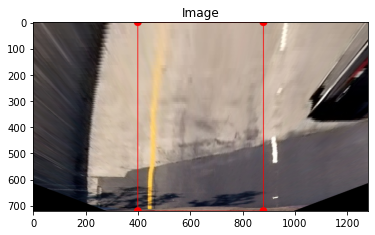

In [70]:
show_image(dst_points_warped)

In [71]:
combined_warped = np.copy(combined)
warped = warper(combined_warped)

src_points_img = add_points(combined_warped, src)
src_points_img = add_lines(src_points_img, src)
dst_points_warped = add_points(warped, dst)

dst_points_warped = add_lines(dst_points_warped, dst)

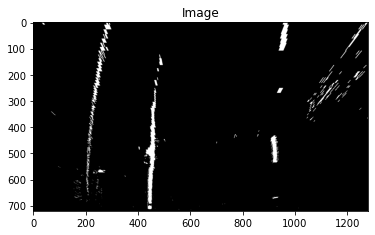

In [73]:
show_image(warped)

## Sliding window for detecting lane lines

In [74]:
ym_per_pix = 3*8/720 # meters per pixel in y dimension, 8 lines (5 spaces, 3 lines) at 10 ft each = 3m
xm_per_pix = 3.7/550 # meters per pixel in x dimension, lane width is 12 ft = 3.7 meters

def calc_line_fits(img):

    ### Settings
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50


    # Take a histogram of the bottom half of the image
    histogram = np.sum(img[img.shape[0]//2:,:], axis=0)

    # plt.figure()
    # plt.plot(histogram)
    
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((img, img, img))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Set height of windows
    window_height = int(img.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = img.shape[0] - (window+1)*window_height
        win_y_high = img.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2)
        cv.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2)
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:
            rightx_current = int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Fit a second order polynomial to each
    left_fit_m = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_m = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    return left_fit, right_fit, left_fit_m, right_fit_m, out_img

In [75]:
left_fit, right_fit, left_fit_m, right_fit_m, out_img = calc_line_fits(warped)

In [76]:
ploty = np.linspace(0, blurred_test_image.shape[0]-1, blurred_test_image.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

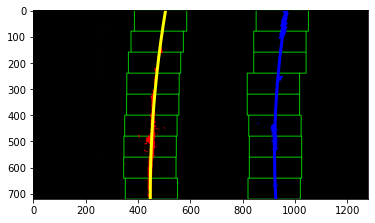

<Figure size 720x720 with 0 Axes>

In [77]:
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow' , linewidth=3)
plt.plot(right_fitx, ploty, color='blue' , linewidth=3)
plt.figure(figsize=(10,10))
plt.show()

### Image Dimensions

In [28]:
print("Image Shape" , RGB_test_image.shape)
image_width = RGB_test_image.shape[1]
image_height = RGB_test_image.shape[0]
print("Image width" , image_width)
print("Image height" , image_height)

Image Shape (720, 1280, 3)
Image width 1280
Image height 720


### Split HLS into Channels
we here divide the HLS image into three channels as we desire to deal with S channel as it provide clear lane lines among the other channels

### Blurring 
we will blurring to the image to just reduce some details and make smoothing to the photo to be able to be concentrated on the lane lines only , we will use `cv.GaussianBlur()`

In [152]:
blurred_test_image = cv.GaussianBlur(s , (5,5) , 0)

NameError: name 's' is not defined

### Edge Detection
We will use **_Canny edge_** detection 

In [ ]:
canny_test_image = cv.Canny(blurred_test_image , 200 ,255)
show_image(canny_test_image)

## Region Of Intereset

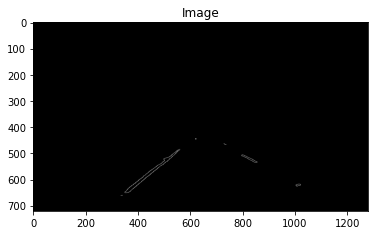

In [29]:
vertices_of_region_of_interest = [(100 , 660) , (image_width / 2 , image_height / 2 + 65) , (1200 , 660)]
cropped_test_image = region_of_intereset(canny_test_image , np.array([vertices_of_region_of_interest] , np.int64))
show_image(cropped_test_image)

### Hough Transform & Optimization
In this section we use Hough transform to find lane lines then averaging the lines to have 2 smooth lines contouring the lane.
`display_lines(image,lines)`: used to draw lines on the image
`average_slope_intercept(image,lines)`: used to get the average of the left_lines from hough transform as a single left_line and to get the average of the right_lines from hough transform as a single right line as well.
`make_coordinates(image,line_parameters)`: used to get points on the line to be able to draw it.
#### Steps:
1. get hough lines.
2. calculate the average of hough lines on the left and right to get a single line on the left and on the right.
3. display these lines on the image.

**_Make Coordinates Helper Function_**

In [30]:
def make_coordinates (image, line_parameters):
    try:
        slope, intercept = line_parameters
    except TypeError:
        slope, intercept = 0.001, 0
    #slope, intercept = line_parameters
    height= image.shape[0]
    y1=height
    y2=int(y1*(0.68)) # 0.8
    x1=int((y1-intercept)/slope)
    x2=int((y2-intercept)/slope)
    
    return np.array([x1,y1,x2,y2])

**_Average Slope Intercept Helper Functions_**

In [31]:
def average_slope_intercept(image,lines):
    left_fit=[]
    right_fit=[]
    if lines is not None:
        for line in lines:
            x1,y1,x2,y2=line.reshape(4)
            parameters=np.polyfit((x1,x2),(y1,y2),1)
            slope=parameters[0]
            intercept=parameters[1]
            if slope<0:
                left_fit.append((slope,intercept))
            else:
                right_fit.append((slope,intercept))
    left_fit_average=np.average(left_fit,axis=0)     
    right_fit_average=np.average(right_fit,axis=0)
    left_line= make_coordinates(image,left_fit_average)
    right_line= make_coordinates(image,right_fit_average)
    
    return np.array([left_line, right_line])

**_Display Lines Helper Function_**

In [32]:
def display_lines(image, lines):
    line_image= np.zeros_like(image)
    if lines is not None :
        for line in lines:
            x1,y1,x2,y2 = line.reshape(4)
#             print (x1, ' ', y1, ' ', x2, ' ', y2) ################3
            cv.line(line_image,(int(x1),int(y1)),(int(x2),int(y2)),(0,0,255),4)     # cv.line(line_image,(x1,y1),(x2,y2),(0,0,255),4)
            #            cv.line(line_image,(x1.astype(np.int64),y1.astype(np.int64)),(x2.astype(np.int64),y2.astype(np.int64)),(0,0,255),4)     # cv.line(line_image,(x1,y1),(x2,y2),(0,0,255),4)
    return line_image

### Offset of the car
`compute_offset(image, lines)`: is used to get the offset and direction of the car. The car center is in the middle of the image. the lane center is calculated using starting points of the lane in the x-axis corresbonding to the height of the image in the y-axis.

In [33]:
def compute_offset(image, lines):
    x=[]
    line_image= np.zeros_like(image)
    car_center = image.shape[1] / 2
    if lines is not None :
        for line in lines:
            x1,y1,x2,y2 = line.reshape(4)
            x.append(x1)
    lane_center = (x[0] + x[1]) / 2  
    offset = abs(lane_center - car_center) * (3.7/700)
    if (x[0] > (1280 - x[1])):
        direction = 'left'
    elif (x[0] < (1280 - x[1])):
        direction = 'right'
    else:
        direction = 'center'
    return offset,direction



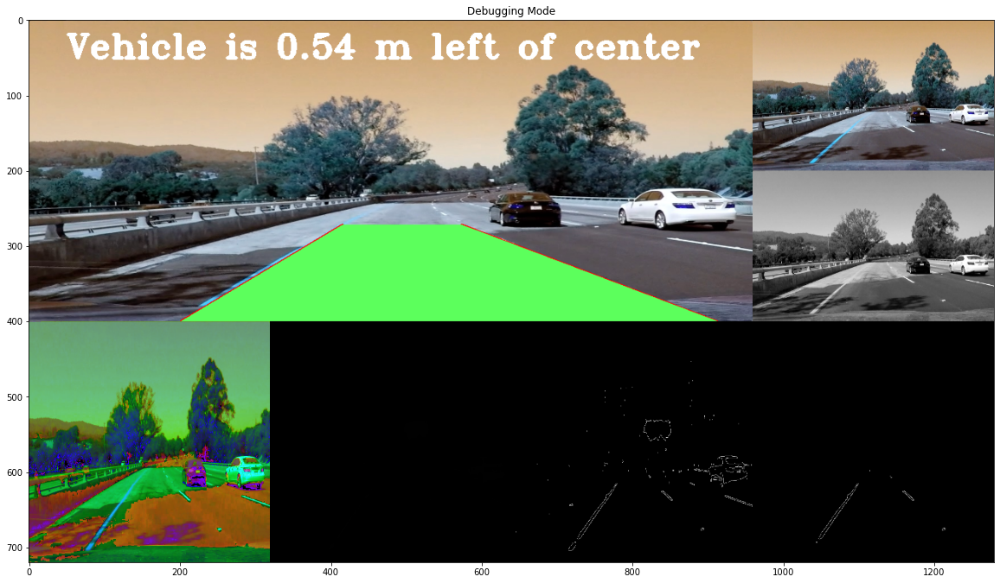

In [34]:
hough_lines = cv.HoughLinesP(cropped_test_image , 1, np.pi / 180 , 20, minLineLength = 7 , maxLineGap = 1)
averaged_lines=average_slope_intercept(RGB_test_image,hough_lines)
line_image=display_lines(RGB_test_image,averaged_lines)
offset,direction=compute_offset(RGB_test_image,averaged_lines)
polyfill_vertices = []
if averaged_lines is not None:
        for line in averaged_lines :
            x1 ,y1 ,x2 ,y2 = line.reshape(4)
            cv.line(RGB_test_image , (x1.astype(np.int64) , y1.astype(np.int64)) , (x2.astype(np.int64) ,y2.astype(np.int64)) , (0 , 0 , 255) , thickness = 4)
            polyfill_vertices.append((x2,y2))
            polyfill_vertices.append((x1,y1))
fill_area_between_lane_lines(RGB_test_image , polyfill_vertices)
if debug_mode == 0 :
    fig = plt.figure(figsize=(15,15))
    fig.add_subplot(1,2,1)
    show_image(test_image, 'Original Image')
    fig.add_subplot(1,2,2)
    cv.putText(img=RGB_test_image, text="Vehicle is {0:.2f} m {1} of center".format(offset, direction), org=(50, 50), fontFace=cv.FONT_HERSHEY_TRIPLEX, fontScale=1.5, color=(255, 255, 255),thickness=3)
    show_image(cv.cvtColor(RGB_test_image , cv.COLOR_RGB2BGR) , 'Processed Image')
elif debug_mode == 1 :
    plt.figure(figsize=(20, 12))
    debugging_image = debugging_mode_image(test_image , gray_test_image , cv.cvtColor(RGB_test_image , cv.COLOR_RGB2BGR) , hls_test_image , combined , canny_test_image , cropped_test_image) # hls_test_image , s , canny_test_image , cropped_test_image
    cv.putText(img=debugging_image, text="Vehicle is {0:.2f} m {1} of center".format(offset, direction), org=(50, 50), fontFace=cv.FONT_HERSHEY_TRIPLEX, fontScale=1.5, color=(255, 255, 255),thickness=3)
    show_image(debugging_image , "Debugging Mode")

### Processing on video frames
We define a function that performs all the previous operations on a given input image to be applied on video frames.

In [35]:
def frame_process(test_image , debug_mode):
    RGB_test_image = np.copy(test_image)
    gray_test_image = cv.cvtColor(RGB_test_image , cv.COLOR_RGB2GRAY)
    image_width = RGB_test_image.shape[1]
    image_height = RGB_test_image.shape[0]
    hls_test_image = cv.cvtColor(RGB_test_image , cv.COLOR_RGB2HLS)
    h , l , s = cv.split(hls_test_image)
    ret,thresh1 = cv.threshold(gray_test_image,120, 255,  cv.THRESH_BINARY+cv.THRESH_OTSU)
    combined = cv.addWeighted(thresh1,0.3,s, 0.7,0)
    blurred_test_image = cv.GaussianBlur(combined , (5,5) , 0)
    canny_test_image = cv.Canny(blurred_test_image , 70 , 255)
    vertices_of_region_of_interest = [(100 , 660) , (image_width / 2 , image_height / 2 + 65) , (1200 , 660)]
    cropped_test_image = region_of_intereset(canny_test_image , np.array([vertices_of_region_of_interest] , np.int64))
    hough_lines = cv.HoughLinesP(cropped_test_image , 1 , np.pi / 180 , 20 , minLineLength = 2 , maxLineGap = 50)
    polyfill_vertices = []
    averaged_lines=average_slope_intercept(RGB_test_image,hough_lines)
    line_image=display_lines(RGB_test_image,averaged_lines)
    offset,direction=compute_offset(RGB_test_image,averaged_lines)
    if averaged_lines is not None:
        for line in averaged_lines :
            x1 ,y1 ,x2 ,y2 = line.reshape(4)
            cv.line(RGB_test_image , (int(x1) , int(y1)) , (int(x2) ,int(y2)) , (0 , 0 , 255) , thickness = 4)
            #            cv.line(RGB_test_image , (x1.astype(np.int64) , y1.astype(np.int64)) , (x2.astype(np.int64) ,y2.astype(np.int64)) , (0 , 0 , 255) , thickness = 4)
            polyfill_vertices.append((x2,y2))
            polyfill_vertices.append((x1,y1))
    fill_area_between_lane_lines(RGB_test_image , polyfill_vertices)
    debugging_image = debugging_mode_image(test_image , gray_test_image , RGB_test_image , hls_test_image , combined , canny_test_image , cropped_test_image)
    if debug_mode == 0 :
        cv.putText(img=RGB_test_image, text="Vehicle is {0:.2f} m {1} of center".format(offset, direction), org=(50, 50), fontFace=cv.FONT_HERSHEY_TRIPLEX, fontScale=1.5, color=(255, 255, 255),thickness=3)
        return RGB_test_image
    elif debug_mode == 1:
        cv.putText(img=debugging_image, text="Vehicle is {0:.2f} m {1} of center".format(offset, direction), org=(50, 50), fontFace=cv.FONT_HERSHEY_TRIPLEX, fontScale=1.5, color=(255, 255, 255),thickness=3)
        return debugging_image

## Testing the previous functions on the test images

#### Test Image 2

In [36]:
test_image2 = cv.imread("test_images/test2.jpg")
test_image2 = cv.cvtColor(test_image2, cv.COLOR_BGR2RGB)
test_image2_processed = frame_process(test_image2 , 1)

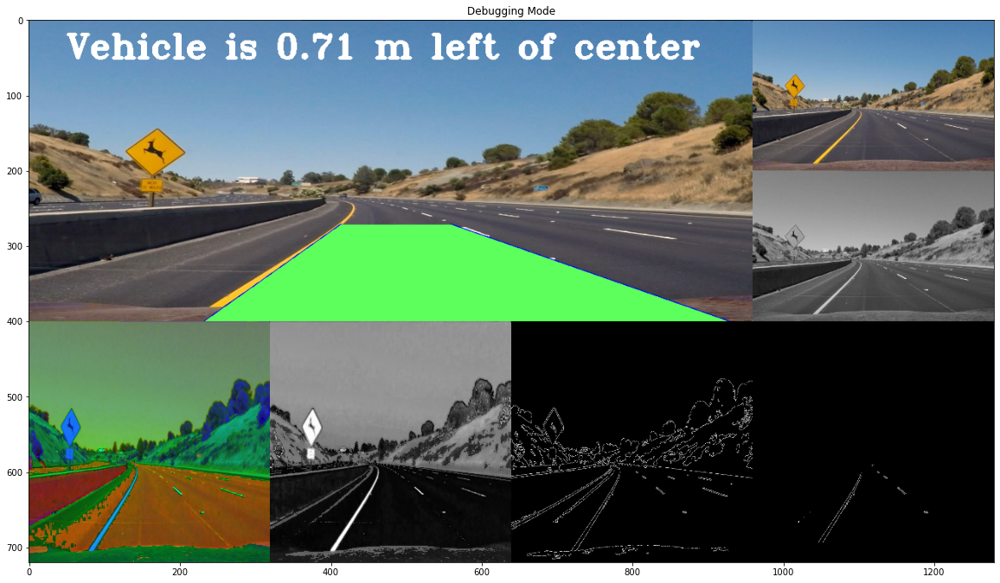

In [37]:
if debug_mode == 0 :
    fig = plt.figure(figsize=(15,15))
    fig.add_subplot(1,2,1)
    show_image(test_image2, 'Original Image')
    fig.add_subplot(1,2,2)
    show_image(test_image2_processed, 'Processed Image')
elif debug_mode == 1 :
    plt.figure(figsize=(20, 12))
    show_image(test_image2_processed , "Debugging Mode")

#### Test Image 3

In [38]:
test_image3 = cv.imread("test_images/test3.jpg")
test_image3 = cv.cvtColor(test_image3, cv.COLOR_BGR2RGB)
test_image3_processed = frame_process(test_image3 , 1)

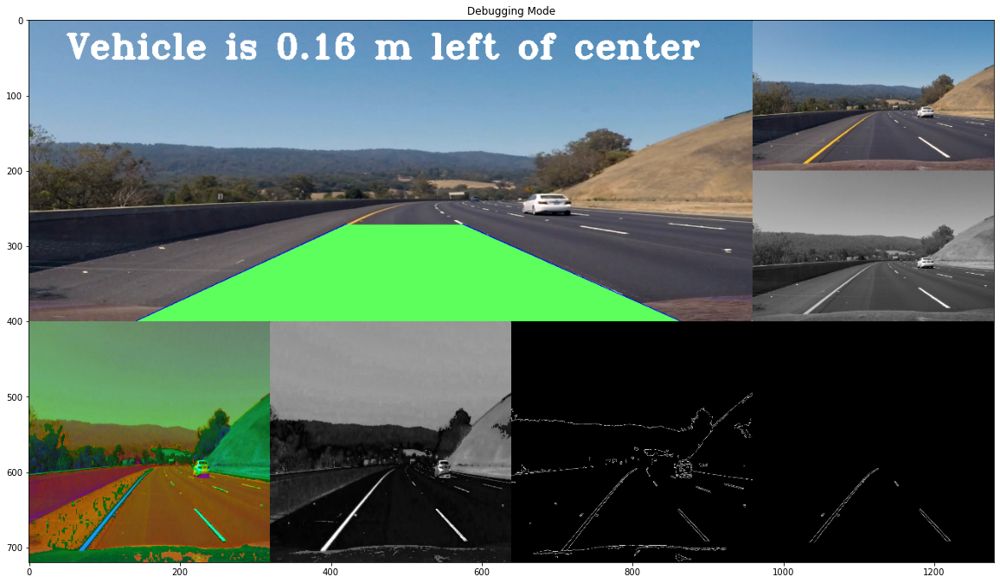

In [39]:
if debug_mode == 0 :
    fig = plt.figure(figsize=(15,15))
    fig.add_subplot(1,2,1)
    show_image(test_image3, 'Original Image')
    fig.add_subplot(1,2,2)
    show_image(test_image3_processed, 'Processed Image')
elif debug_mode == 1 :
    plt.figure(figsize=(20, 12))
    show_image(test_image3_processed , "Debugging Mode")

#### Test Image 4

In [40]:
test_image4 = cv.imread("test_images/test4.jpg")
test_image4 = cv.cvtColor(test_image4, cv.COLOR_BGR2RGB)
test_image4_processed = frame_process(test_image4 , 1)

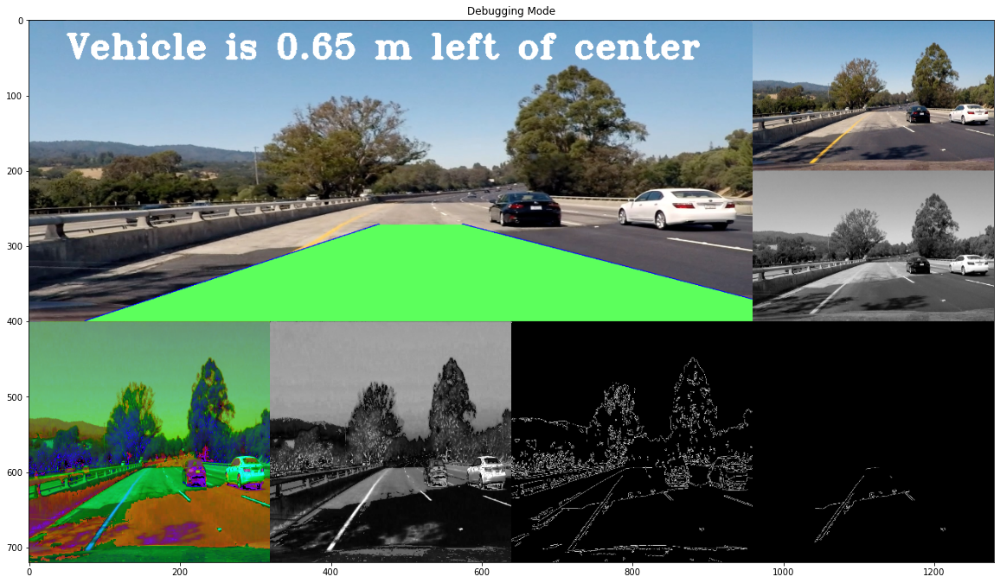

In [41]:
if debug_mode == 0 :
    fig = plt.figure(figsize=(15,15))
    fig.add_subplot(1,2,1)
    show_image(test_image4, 'Original Image')
    fig.add_subplot(1,2,2)
    show_image(test_image4_processed, 'Processed Image')
elif debug_mode == 1 :
    plt.figure(figsize=(20, 12))
    show_image(test_image4_processed , "Debugging Mode")

#### Test Image 5

In [42]:
test_image5 = cv.imread("test_images/test5.jpg")
test_image5 = cv.cvtColor(test_image5, cv.COLOR_BGR2RGB)
test_image5_processed = frame_process(test_image5 , 1)

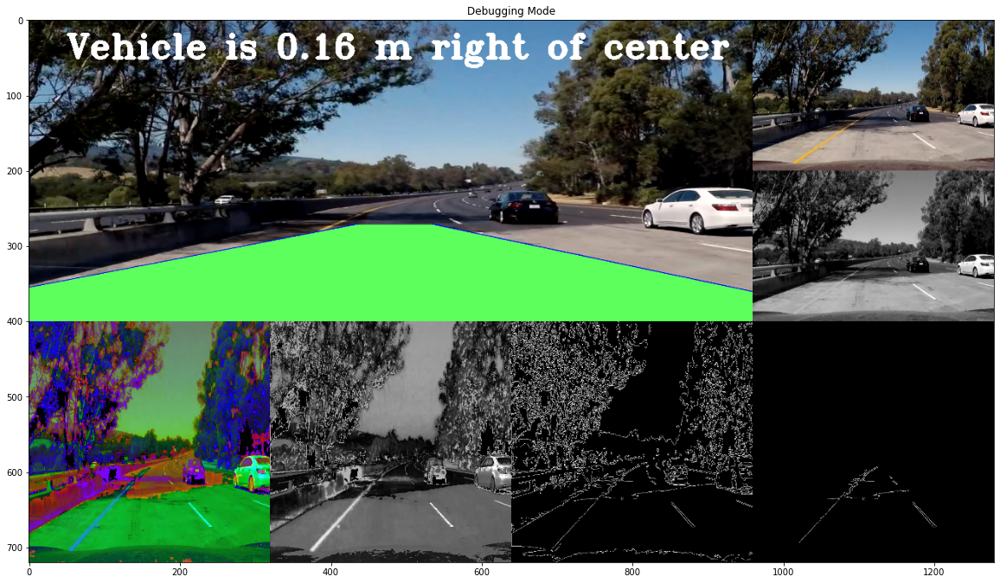

In [43]:
if debug_mode == 0 :
    fig = plt.figure(figsize=(15,15))
    fig.add_subplot(1,2,1)
    show_image(test_image5, 'Original Image')
    fig.add_subplot(1,2,2)
    show_image(test_image5_processed, 'Processed Image')
elif debug_mode == 1 :
    plt.figure(figsize=(20, 12))
    show_image(test_image5_processed , "Debugging Mode")

#### Test Image 6

In [44]:
test_image6 = cv.imread("test_images/test6.jpg")
test_image6 = cv.cvtColor(test_image6, cv.COLOR_BGR2RGB)
test_image6_processed = frame_process(test_image6 , 1)

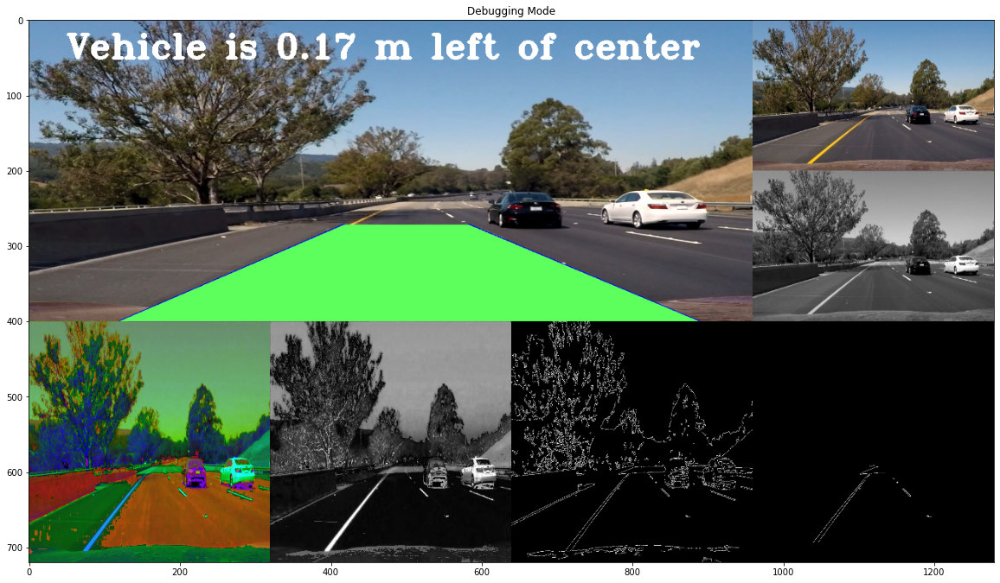

In [45]:
if debug_mode == 0 :
    fig = plt.figure(figsize=(15,15))
    fig.add_subplot(1,2,1)
    show_image(test_image6, 'Original Image')
    fig.add_subplot(1,2,2)
    show_image(test_image6_processed, 'Processed Image')
elif debug_mode == 1 :
    plt.figure(figsize=(20, 12))
    
    show_image(test_image6_processed , "Debugging Mode")


#### Test Image 7 (straight lines 1)

In [46]:
test_image7 = cv.imread("test_images/straight_lines1.jpg")
test_image7 = cv.cvtColor(test_image7, cv.COLOR_BGR2RGB)
test_image7_processed = frame_process(test_image7 , 1)

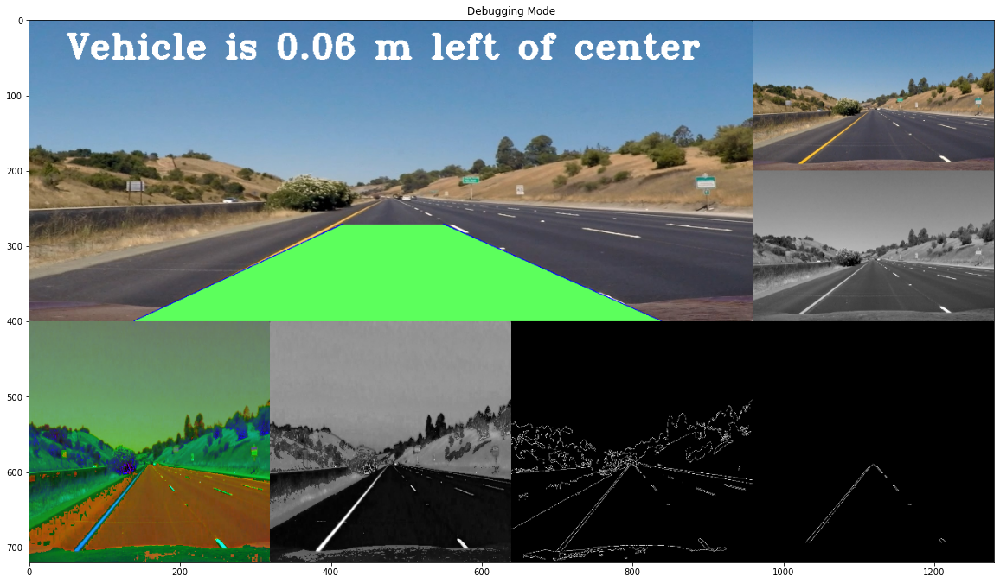

In [47]:
if debug_mode == 0 :
    fig = plt.figure(figsize=(15,15))
    fig.add_subplot(1,2,1)
    show_image(test_image7, 'Original Image')
    fig.add_subplot(1,2,2)
    show_image(test_image7_processed, 'Processed Image')
elif debug_mode == 1 :
    plt.figure(figsize=(20, 12))
    show_image(test_image7_processed , "Debugging Mode")

#### Test Image 8 (straight lines 2)

In [48]:
test_image8 = cv.imread("test_images/straight_lines2.jpg")
test_image8 = cv.cvtColor(test_image8, cv.COLOR_BGR2RGB)
test_image8_processed = frame_process(test_image8 , 1)

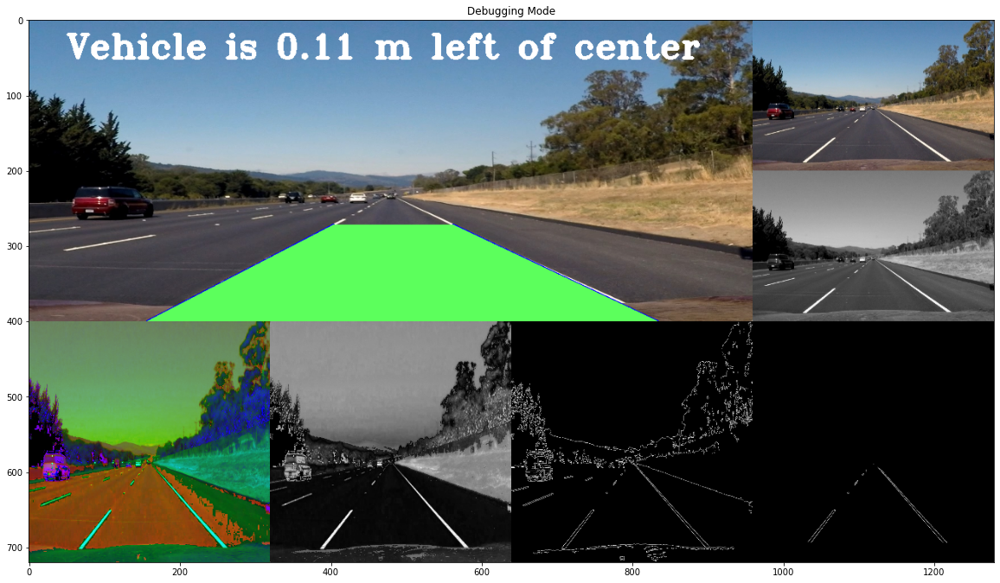

In [49]:
if debug_mode == 0 :
    fig = plt.figure(figsize=(15,15))
    fig.add_subplot(1,2,1)
    show_image(test_image8, 'Original Image')
    fig.add_subplot(1,2,2)
    show_image(test_image8_processed, 'Processed Image')
elif debug_mode == 1 :
    plt.figure(figsize=(20, 12))
    show_image(test_image8_processed , "Debugging Mode")

### Testing on video

**_Without Debug Mode_**

In [50]:
cap = cv.VideoCapture("project_video.mp4")
while(cap.isOpened()):
    _, frame = cap.read()
    if frame is None:
        print('Frame not successfully read')
        break
    processed_frame = frame_process(frame, 0)
    cv.imshow("result", processed_frame)
    if cv.waitKey(1)  == ord('q'):
        break
cap.release()
cv.destroyAllWindows()

error: OpenCV(4.5.5) :-1: error: (-5:Bad argument) in function 'line'
> Overload resolution failed:
>  - Can't parse 'pt1'. Sequence item with index 0 has a wrong type
>  - Can't parse 'pt1'. Sequence item with index 0 has a wrong type


**_With Debug Mode_**

In [ ]:
cap = cv.VideoCapture("harder_challenge_video.mp4")
while(cap.isOpened()):
    _, frame = cap.read()
    if frame is None:
        break
    processed_frame = frame_process(frame, 1)
    cv.imshow("result", processed_frame)
    if cv.waitKey(1)  == ord('q'):
        break
cap.release()
cv.destroyAllWindows()

| **Name** | **ID** |
| --- | --- |
| Shereen Reda Sayed Mohamed | 1804990 |
| Mahmoud Khaled Abdelaal Aly | 1801004 |
| Maram Nabil Ibrahim Ali | 1803746 |
